In [ ]:
import numpy as np
import pandas as pd
import polars as pl
import polars.selectors as cs
from pylab import plt, mpl


plt.style.use("seaborn-v0_8")
mpl.rcParams["savefig.dpi"] = 300
mpl.rcParams["font.family"] = "serif"
pd.set_option("display.precision", 4)
np.set_printoptions(suppress=True, precision=4)

In [2]:
import warnings

warnings.simplefilter("ignore")

In [ ]:
# !wget http://hilpisch.com/aiif_eikon_eod_data.csv
# url = 'http://hilpisch.com/aiif_eikon_eod_data.csv'

In [3]:
data = pl.read_csv(
    source="/home/volody/code/study-py/ts-pytorch/hilpisch_6/aiif_eikon_eod_data.csv",
    has_header=True,
    try_parse_dates=True,
)
data.head()

Date,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
date,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2010-01-01,null,null,null,null,null,null,null,null,1.4323,1096.35,null,null
2010-01-04,30.572827,30.95,20.88,133.9,173.08,113.33,1132.99,20.04,1.4411,1120.0,47.71,109.8
2010-01-05,30.625684,30.96,20.87,134.69,176.14,113.63,1136.52,19.35,1.4368,1118.65,48.17,109.7
2010-01-06,30.138541,30.77,20.8,132.25,174.26,113.71,1137.14,19.16,1.4412,1138.5,49.34,111.51
2010-01-07,30.082827,30.452,20.6,130.0,177.67,114.19,1141.69,19.06,1.4318,1131.9,49.1,110.82


In [4]:
data = data.filter(~pl.any_horizontal(pl.all().is_null()))
data = data.with_columns(pl.exclude("Date") / pl.exclude("Date").head(1))
data.head(5)

Date,AAPL.O,MSFT.O,INTC.O,AMZN.O,GS.N,SPY,.SPX,.VIX,EUR=,XAU=,GDX,GLD
date,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2010-01-04,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2010-01-05,1.001729,1.000323,0.999521,1.0059,1.01768,1.002647,1.003116,0.965569,0.997016,0.998795,1.009642,0.999089
2010-01-06,0.985795,0.994184,0.996169,0.987677,1.006818,1.003353,1.003663,0.956088,1.000069,1.016518,1.034165,1.015574
2010-01-07,0.983973,0.98391,0.98659,0.970874,1.02652,1.007588,1.007679,0.951098,0.993547,1.010625,1.029134,1.00929
2010-01-08,0.990514,0.99063,0.997605,0.997162,1.007107,1.010941,1.010583,0.904691,1.000069,1.014375,1.044645,1.014299


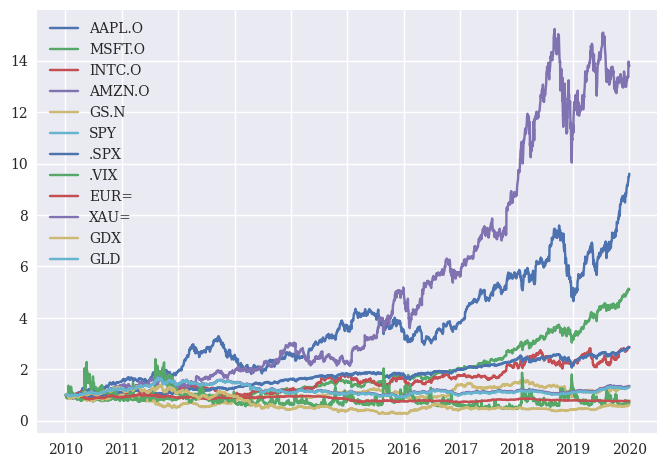

In [5]:
for col in data.select(cs.numeric()).columns:
    plt.plot(
        data.select(pl.col("Date")).to_numpy(),
        data.select(pl.col(col)).to_numpy(),
        label=col,
    )
plt.legend()

In [ ]:
# fig = px.line(data, x="Date", y=data.select(pl.exclude("Date")).columns)  # pl.exclude("Date"
# fig.show()

In [ ]:
def add_lags(data, ric, lags):
    cols = []
    df = pd.DataFrame(data[ric])
    for lag in range(1, lags + 1):
        col = "lag_{}".format(lag)
        df[col] = df[ric].shift(lag)
        cols.append(col)
    df.dropna(inplace=True)
    return df, cols